#### Import Libraries

#### Load Data

In [25]:
import pandas as pd
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import numpy as np
import random
from tensorflow import keras
from keras_tuner import RandomSearch
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense, GlobalAveragePooling2D
from tensorflow.keras.applications import VGG16, VGG19, InceptionV3, ResNet50, Xception, EfficientNetB0, MobileNet
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras_tuner.tuners import BayesianOptimization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from PIL import Image

In [2]:
df = pd.read_csv('MLPA_Final/birds.csv')

filepaths = 'MLPA_Final/' + df['filepaths']
df = df[filepaths.isin(filepaths[filepaths.apply(os.path.exists)])]

train_set = 'MLPA_Final/train'
test_set = 'MLPA_Final/test'
valid_set = 'MLPA_Final/valid'

train_datagen = ImageDataGenerator(rescale=1. / 255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

val_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
        train_set,
        target_size=(224, 224),
        batch_size=32,
        shuffle = True,
        class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
        test_set,
        target_size=(224, 224),
        batch_size=32,
        shuffle = True,
        class_mode='categorical')

valid_generator = val_datagen.flow_from_directory(
        valid_set,
        target_size=(224, 224),
        batch_size=32,
        shuffle = True,
        class_mode='categorical')


Found 84635 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.


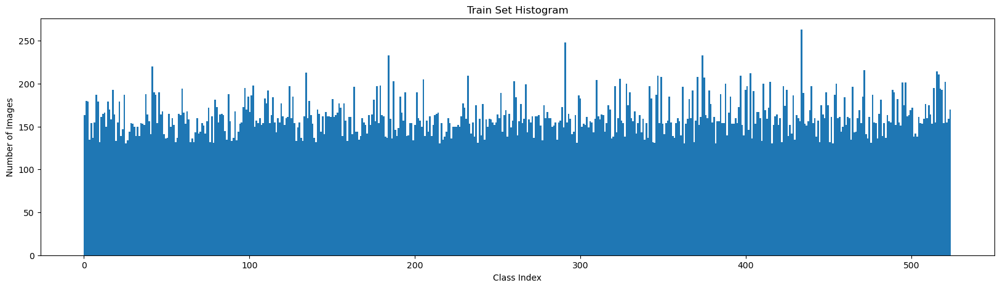

In [3]:
import matplotlib.pyplot as plt
import os

directory = r'D:\PythonStuff\MLPA_Final\train'

classes = os.listdir(directory)

image_counts = []
for cls in classes:
    class_path = os.path.join(directory, cls)
    image_counts.append(len(os.listdir(class_path)))

plt.figure(figsize=(20, 5)) 
plt.hist(range(len(classes)), bins=len(classes), weights=image_counts)
plt.title('Train Set Histogram')
plt.xlabel('Class Index')
plt.ylabel('Number of Images')
plt.show()

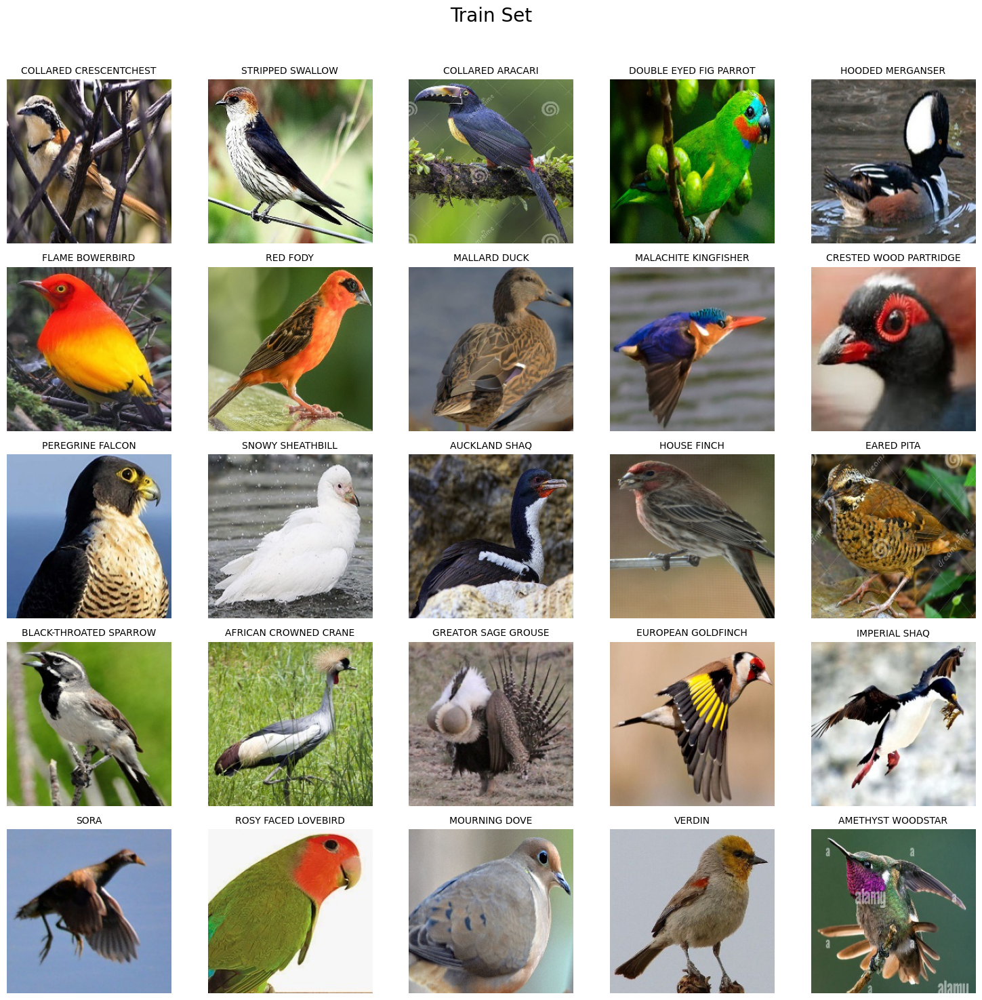

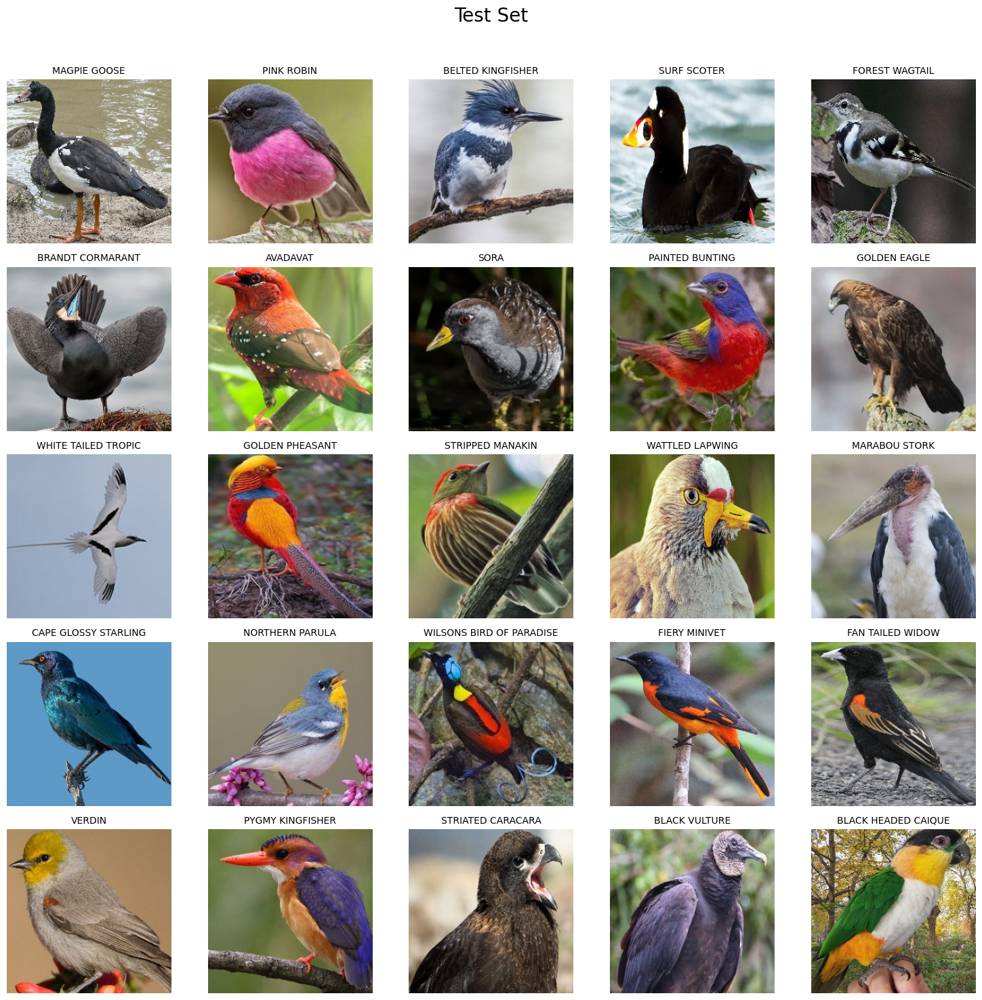

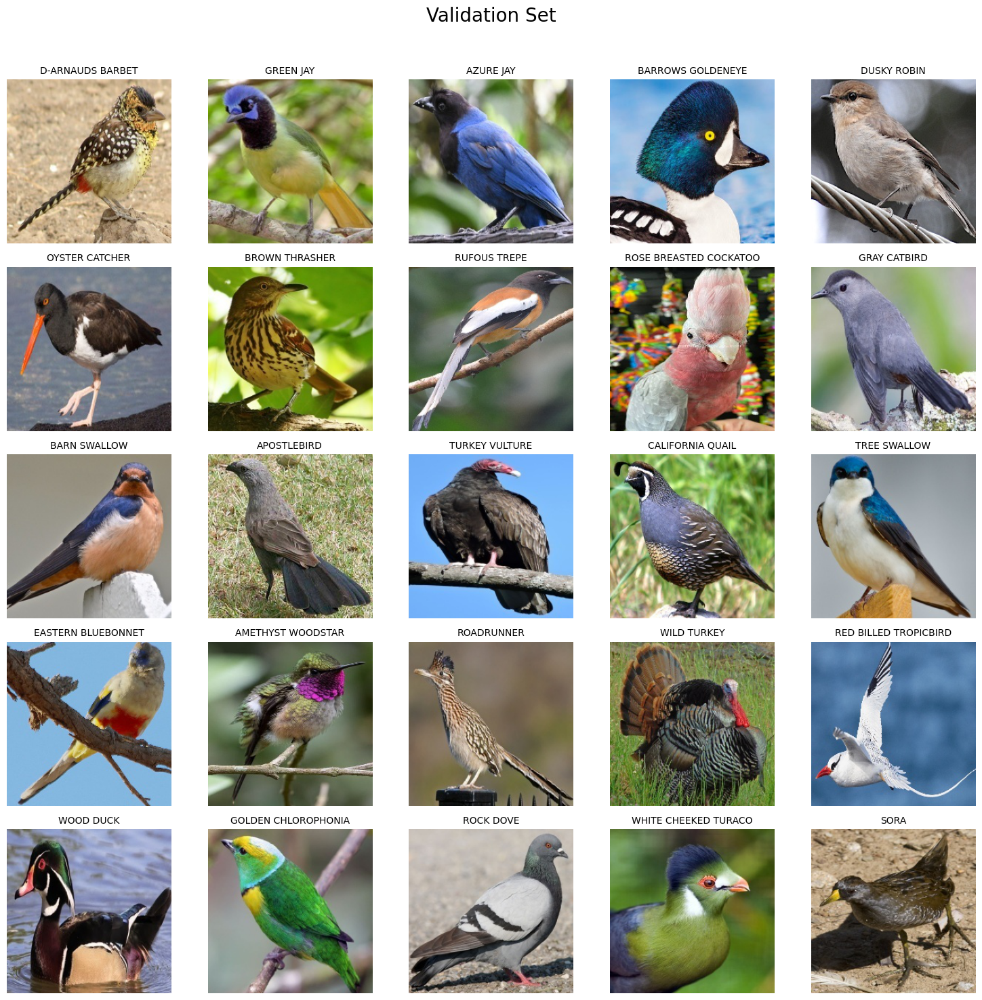

In [4]:
def plot_images_from_each_class(directory, num_classes=25, title=''):
    classes = os.listdir(directory)
   
    selected_classes = random.sample(classes, num_classes)

    plt.figure(figsize=(15, 15))
    plt.suptitle(title, fontsize=20)
    for i, cls in enumerate(selected_classes):
        path = os.path.join(directory, cls)
        selected_image = random.choice(os.listdir(path))
        img = Image.open(os.path.join(path, selected_image))
        plt.subplot(5, 5, i+1)
        plt.imshow(img)
        plt.title(cls, fontsize=10)
        plt.axis("off")
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_images_from_each_class(r'D:\PythonStuff\MLPA_Final\train', title='Train Set')
plot_images_from_each_class(r'D:\PythonStuff\MLPA_Final\test', title='Test Set')
plot_images_from_each_class(r'D:\PythonStuff\MLPA_Final\valid', title='Validation Set')


In [5]:
input_shape = (224, 224, 3)
num_classes = 525  

base_models = [
    VGG16(weights='imagenet', include_top=False, input_shape=input_shape),
    VGG19(weights='imagenet', include_top=False, input_shape=input_shape),
    InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape),
    ResNet50(weights='imagenet', include_top=False, input_shape=input_shape),
    Xception(weights='imagenet', include_top=False, input_shape=input_shape),
    EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape),
    MobileNet(weights='imagenet', include_top=False, input_shape=input_shape)
]

models = []

for base_model in base_models:

    base_model.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)

    x = Dense(1024, activation='relu')(x)

    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    models.append(model)


In [6]:
best_model = None
best_val_accuracy = 0

for model in models:

    model.fit(train_generator, steps_per_epoch=5, epochs=5, validation_data=valid_generator)
    
    val_loss, val_accuracy = model.evaluate(valid_generator)
    
    if val_accuracy > best_val_accuracy:
        best_val_accuracy = val_accuracy
        best_model = model

Epoch 1/5
5/5 [==============================] - 151s 37s/step - loss: 6.3653 - accuracy: 0.0000e+00 - val_loss: 6.5001 - val_accuracy: 0.0030
Epoch 2/5
5/5 [==============================] - 150s 37s/step - loss: 6.6154 - accuracy: 0.0000e+00 - val_loss: 6.5933 - val_accuracy: 0.0019
Epoch 3/5
5/5 [==============================] - 154s 38s/step - loss: 6.6541 - accuracy: 0.0000e+00 - val_loss: 6.4422 - val_accuracy: 0.0057
Epoch 4/5
5/5 [==============================] - 157s 39s/step - loss: 6.3998 - accuracy: 0.0000e+00 - val_loss: 6.3198 - val_accuracy: 0.0019
Epoch 5/5
83/83 [==============================] - 147s 2s/step - loss: 6.2798 - accuracy: 0.0019
Epoch 1/5
5/5 [==============================] - 190s 47s/step - loss: 6.3922 - accuracy: 0.0000e+00 - val_loss: 6.5229 - val_accuracy: 0.0019
Epoch 2/5
5/5 [==============================] - 187s 46s/step - loss: 6.5691 - accuracy: 0.0000e+00 - val_loss: 6.5841 - val_accuracy: 0.0019
Epoch 3/5
5/5 [=============================

In [10]:
input_shape = (224, 224, 3)
num_classes = 525  

base_model = Xception(weights='imagenet', include_top=False, input_shape=input_shape)

def build_model(hp):
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    
    hp_units = hp.Int('units', min_value=512, max_value=1200, step=32)
    x = Dense(units=hp_units, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)
    
    for layer in base_model.layers:
        layer.trainable = False

    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 5e-4])

    model.compile(optimizer=Adam(learning_rate=hp_learning_rate), 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])
    
    return model 


tuner = BayesianOptimization(
    build_model,
    objective='val_accuracy',
    max_trials=10,
    executions_per_trial=1,
    directory='my_dir',
    project_name='bird_species')

tuner.search(train_generator, validation_data=valid_generator)


Trial 10 Complete [00h 50m 01s]
val_accuracy: 0.7820952534675598

Best val_accuracy So Far: 0.7820952534675598
Total elapsed time: 08h 44m 13s
INFO:tensorflow:Oracle triggered exit


In [23]:
best_hps = tuner.get_best_hyperparameters(num_trials = 1)[0]

print(f"""
The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is {best_hps.get('units')} and the optimal learning rate for the optimizer
is {best_hps.get('learning_rate')}.
""")



The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is 672 and the optimal learning rate for the optimizer
is 0.0005.



In [11]:
best_hps = tuner.get_best_hyperparameters(num_trials = 1)[0]

print(best_hps)

model = tuner.hypermodel.build(best_hps)

model.fit(train_generator, epochs=30, validation_data=valid_generator, verbose=1)

Epoch 1/30
2645/2645 [==============================] - 2939s 1s/step - loss: 1.9082 - accuracy: 0.5498 - val_loss: 0.7890 - val_accuracy: 0.7790
Epoch 2/30
2645/2645 [==============================] - 2942s 1s/step - loss: 1.0248 - accuracy: 0.7271 - val_loss: 0.5977 - val_accuracy: 0.8259
Epoch 3/30
2645/2645 [==============================] - 2943s 1s/step - loss: 0.8499 - accuracy: 0.7688 - val_loss: 0.5364 - val_accuracy: 0.8472
Epoch 4/30
2645/2645 [==============================] - 2949s 1s/step - loss: 0.7418 - accuracy: 0.7952 - val_loss: 0.4795 - val_accuracy: 0.8571
Epoch 5/30
2645/2645 [==============================] - 2953s 1s/step - loss: 0.6753 - accuracy: 0.8123 - val_loss: 0.4433 - val_accuracy: 0.8697
Epoch 6/30
2645/2645 [==============================] - 2945s 1s/step - loss: 0.6263 - accuracy: 0.8224 - val_loss: 0.4344 - val_accuracy: 0.8720
Epoch 7/30
2645/2645 [==============================] - 2948s 1s/step - loss: 0.5804 - accuracy: 0.8336 - val_loss: 0.4262 -

In [13]:
test_loss, test_accuracy = model.evaluate(test_generator)
print(f'Test accuracy: {test_accuracy}')

model.save('birdcall_model.h5')

83/83 [==============================] - 84s 1s/step - loss: 0.3285 - accuracy: 0.9154
Test accuracy: 0.9154285788536072


In [14]:
print(len(model.layers))

135


In [16]:
import os
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

model = keras.models.load_model('birdcall_model.h5')

for layer in model.layers:
    layer.trainable = False

start_fine_tuning_at = 90  
for layer in model.layers[start_fine_tuning_at:]:
    layer.trainable = True

early_stopping_cb = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

checkpoint_path = 'best_model.h5'
checkpoint_cb = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True, mode='max')

model.compile(optimizer=Adam(learning_rate=best_hps.get('learning_rate')), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

history = model.fit(train_generator, 
                    validation_data=valid_generator, 
                    epochs=10,
                    callbacks=[early_stopping_cb, checkpoint_cb],
                    verbose=1)

val_accuracy = max(history.history['val_accuracy'])
print(f"Overall Validation Accuracy: {val_accuracy:.4f}")


Epoch 1/10
2645/2645 [==============================] - 5800s 2s/step - loss: 0.6179 - accuracy: 0.8257 - val_loss: 0.3407 - val_accuracy: 0.9105
Epoch 2/10
2645/2645 [==============================] - 5809s 2s/step - loss: 0.4047 - accuracy: 0.8836 - val_loss: 0.2939 - val_accuracy: 0.9177
Epoch 3/10
2645/2645 [==============================] - 5823s 2s/step - loss: 0.3272 - accuracy: 0.9041 - val_loss: 0.2519 - val_accuracy: 0.9314
Epoch 4/10
2645/2645 [==============================] - 5833s 2s/step - loss: 0.2679 - accuracy: 0.9208 - val_loss: 0.2725 - val_accuracy: 0.9288
Epoch 5/10
2645/2645 [==============================] - 5885s 2s/step - loss: 0.2297 - accuracy: 0.9308 - val_loss: 0.2765 - val_accuracy: 0.9333
Epoch 6/10
2645/2645 [==============================] - 5813s 2s/step - loss: 0.1989 - accuracy: 0.9398 - val_loss: 0.2240 - val_accuracy: 0.9375
Epoch 7/10
2645/2645 [==============================] - 5821s 2s/step - loss: 0.1757 - accuracy: 0.9473 - val_loss: 0.2329 -

In [17]:
model = keras.models.load_model('best_model.h5')
test_loss, test_accuracy = model.evaluate(test_generator)
print(f'Test accuracy: {test_accuracy}')

83/83 [==============================] - 86s 1s/step - loss: 0.1170 - accuracy: 0.9676
Test accuracy: 0.9676190614700317


#### Feature Selection: Look at the first kernel of the convolutional matrix that contains weights

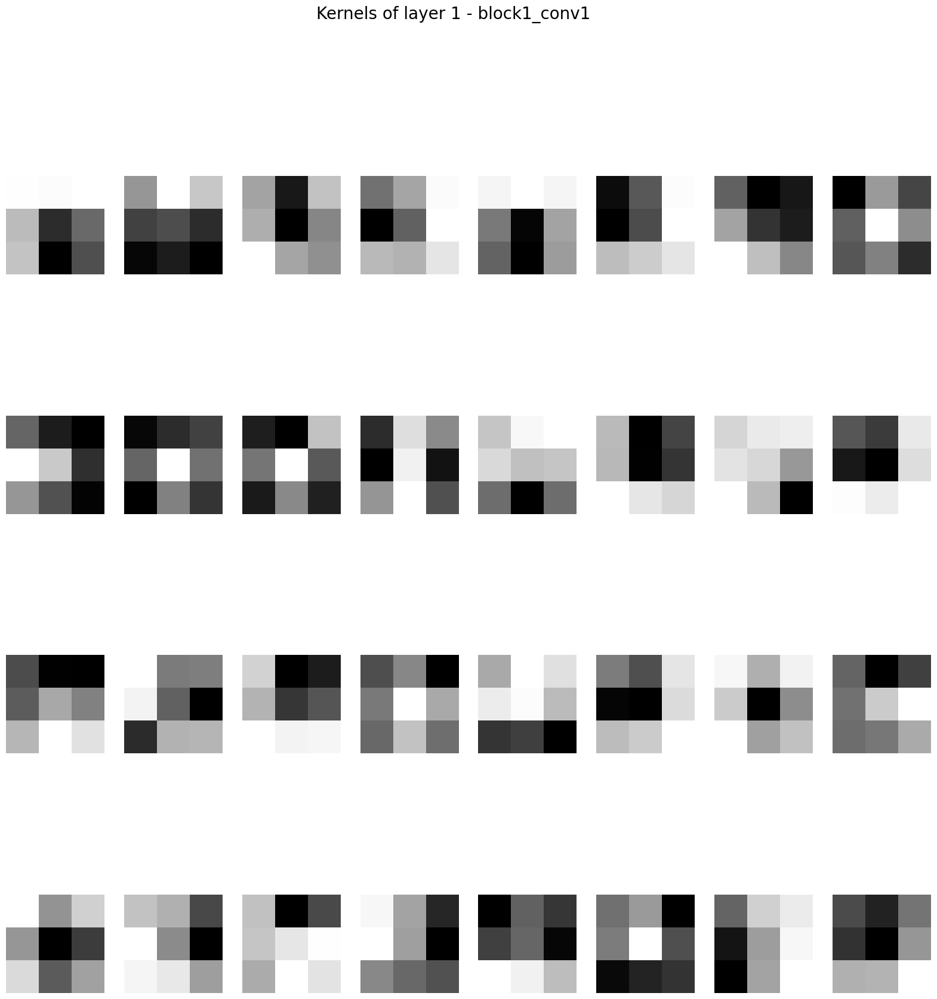

In [18]:
weights = None
layer_counter = 0
for layer in model.layers:
    if len(layer.get_weights()) > 0:
        weights = layer.get_weights()[0]
        layer_name = layer.name
        break
    layer_counter += 1

if weights is not None:
    weights_min = np.min(weights)
    weights_max = np.max(weights)
    weights = (weights - weights_min) / (weights_max - weights_min)

    fig, axs = plt.subplots(4,8, figsize=(20,20))
    fig.suptitle(f'Kernels of layer {layer_counter} - {layer_name}', fontsize=20)
    for i in range(weights.shape[-1]):
        ax = axs[i//8, i%8]
        ax.imshow(weights[:,:,0,i], cmap='gray', interpolation='nearest')
        ax.axis('off')
    plt.show()
else:
    print("No weights found in the model.")